In [52]:
import pyshearlab
from PIL import Image
import numpy as np
from skimage.transform import resize
import matplotlib.pyplot as plt
from pyshearlab import dfilters, modulate2, SLprepareFilters2D, SLgetShearletIdxs2D

<class 'numpy.ndarray'> 0 254


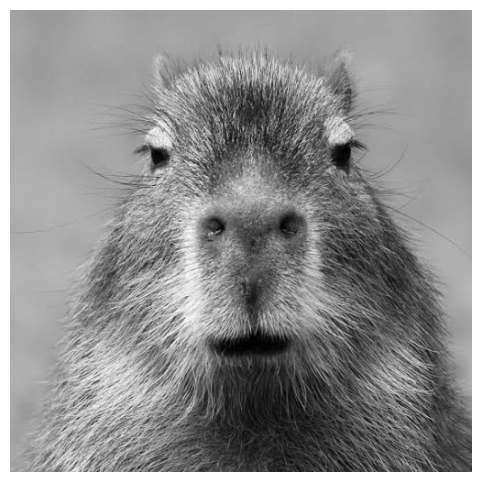

In [53]:
size = 512
img = np.array(Image.open("/home/jroth/shearlet-extraction/capybara.png").convert('L'))
print(type(img), img.min(), img.max())
image = resize(img, (size,size))

plt.figure(figsize = (6,6))
plt.axis("off")
plt.imshow(image, cmap = "gray")
plt.show()

In [54]:
from pyshearlab import SLgetShearletSystem2D

og_system = SLgetShearletSystem2D(0, size, size, 1)

shearlets = og_system["shearlets"]

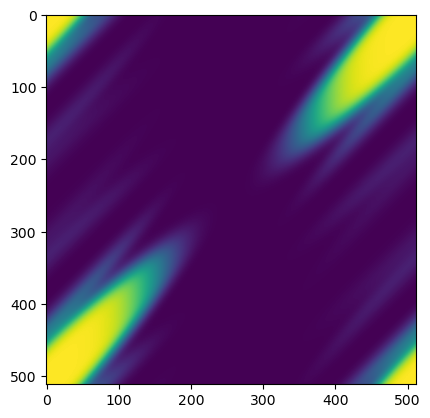

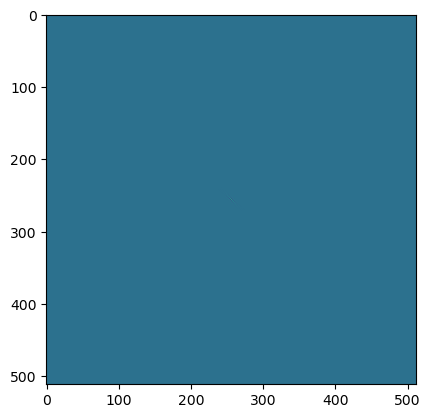

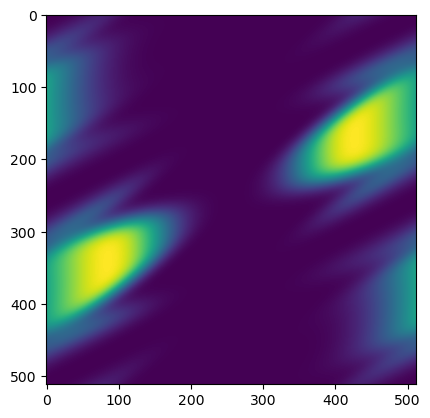

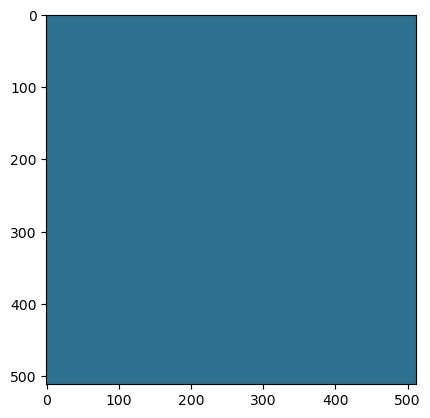

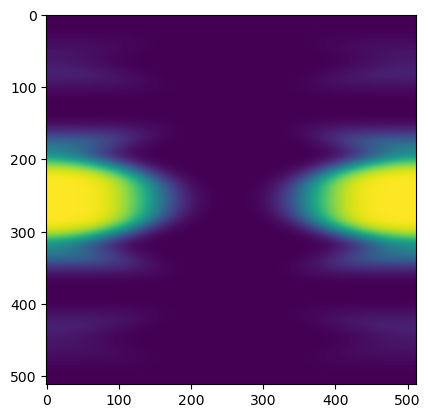

...

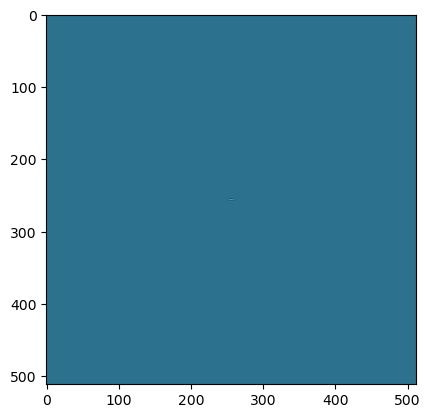

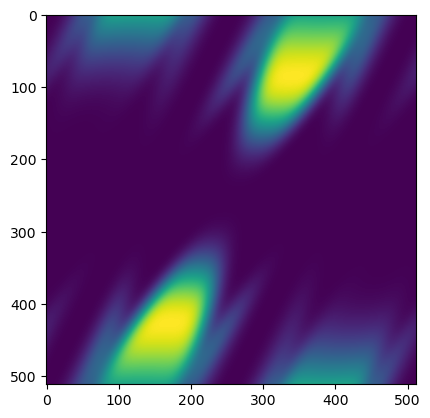

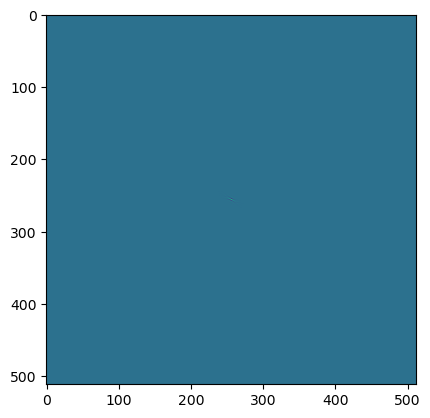

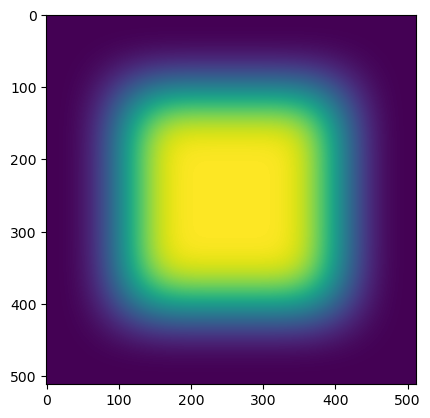

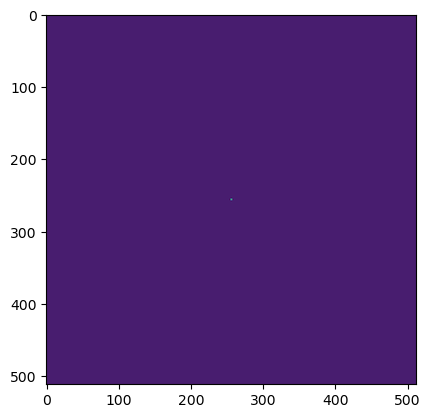

In [55]:
fftlib = np.fft

for i in range(shearlets.shape[-1]):
    plt.imshow(shearlets[..., i].real)
    plt.show()
    plt.imshow(fftlib.fftshift(fftlib.fft2(fftlib.ifftshift(shearlets[..., i]))).real)
    plt.show()

In [56]:
from test_code.test import myShearletSystem

system1, system2 = myShearletSystem(size, size)
shearlets = system1["shearlets"]

9 8


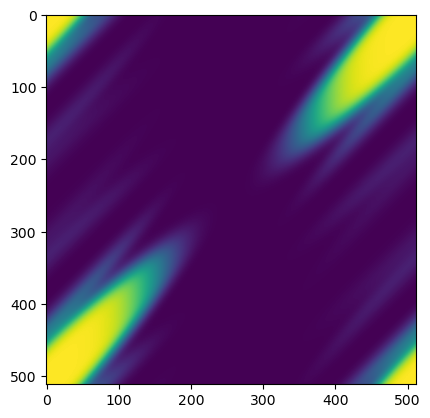

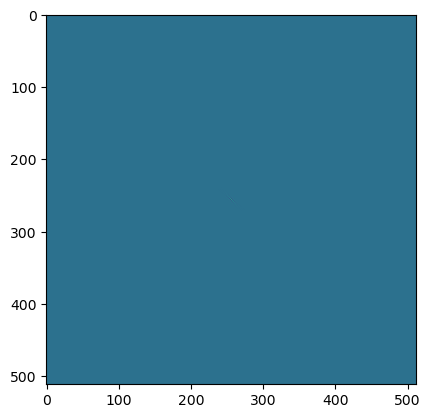

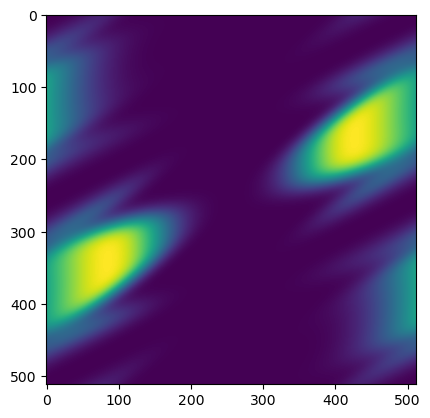

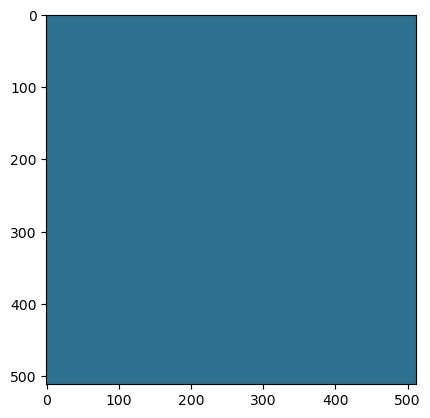

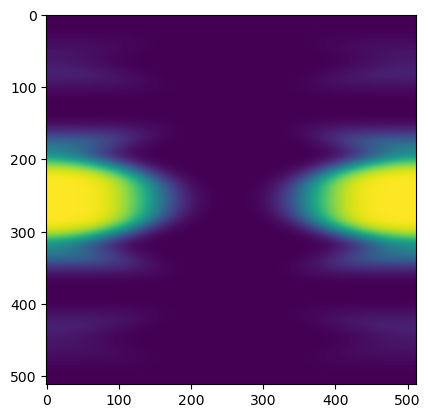

...

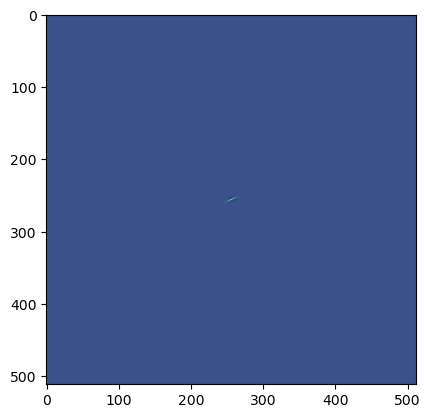

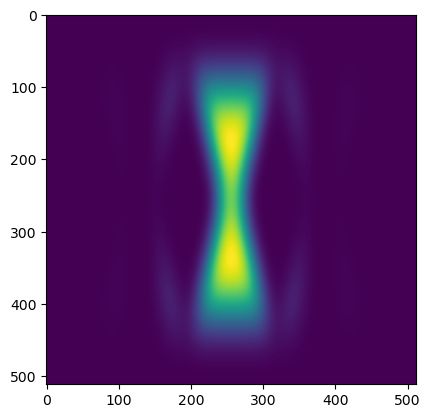

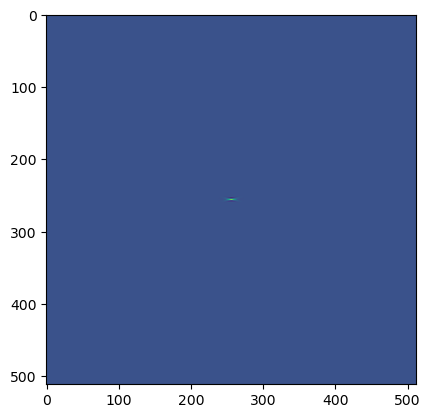

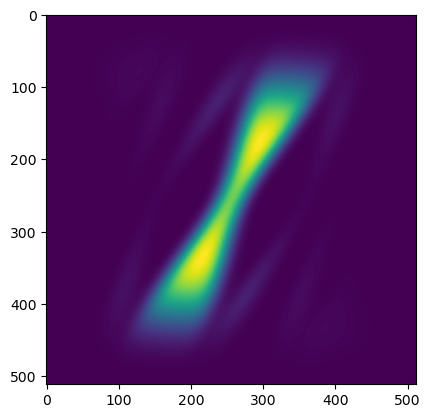

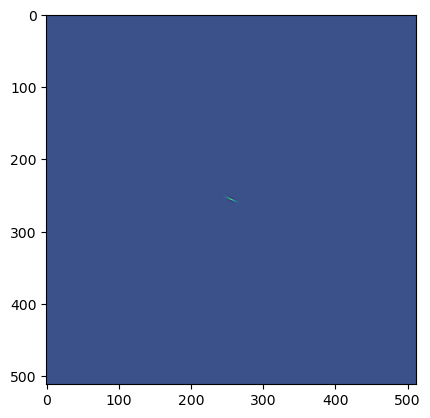

In [57]:
fftlib = np.fft

for i in range(shearlets.shape[-1]):
    plt.imshow(shearlets[..., i].real)
    plt.show()
    plt.imshow(fftlib.fftshift(fftlib.fft2(fftlib.ifftshift(shearlets[..., i]))).real)
    plt.show()

In [61]:
nScales = 1
shearLevels = np.ceil(np.arange(1, nScales + 1) / 2).astype(int)


h0, h1 = dfilters("dmaxflat4", "d")

h0 /= np.sqrt(2)
h1 /= np.sqrt(2)

directionalFilter = modulate2(h0, "c")

quadratureMirrorFilter = np.array(
            [
                0.0104933261758410,
                -0.0263483047033631,
                -0.0517766952966370,
                0.276348304703363,
                0.582566738241592,
                0.276348304703363,
                -0.0517766952966369,
                -0.0263483047033631,
                0.0104933261758408,
            ]
        )
# skipping use gpu stuff for the moment...
preparedFilters = SLprepareFilters2D(
    image.shape[0],
    image.shape[1],
    nScales,
    shearLevels,
    directionalFilter,
    quadratureMirrorFilter,
)

[2]


IndexError: index 1023 is out of bounds for axis 0 with size 512

In [ ]:
shearletIdxs = SLgetShearletIdxs2D(preparedFilters["shearLevels"])

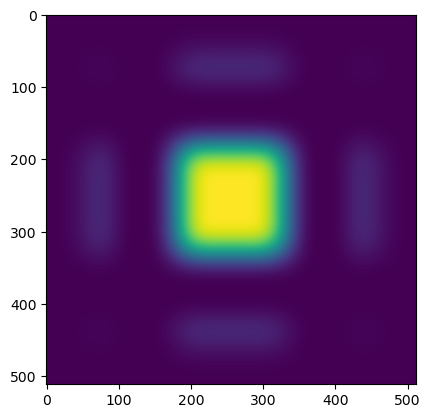

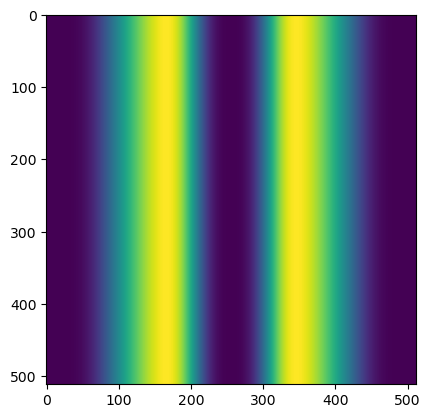

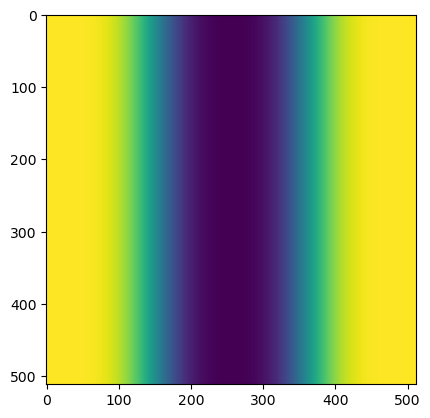

In [ ]:
bandpass = preparedFilters["cone1"]["bandpass"]
lowpass = preparedFilters["cone1"]["lowpass"][..., np.newaxis]

plt.imshow(lowpass.real)
plt.show()

for i in range(bandpass.shape[-1]):
    plt.imshow(bandpass[..., i].real)
    plt.show()

(512, 512, 5) (512, 512, 1)


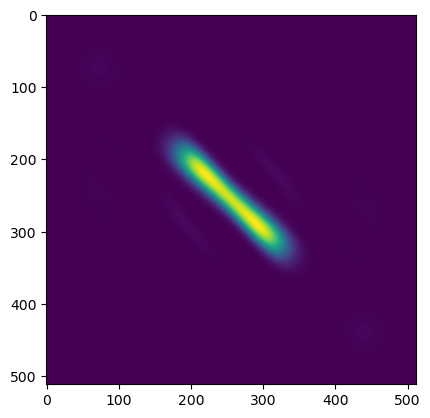

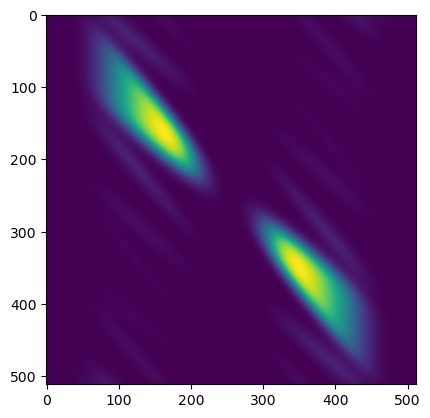

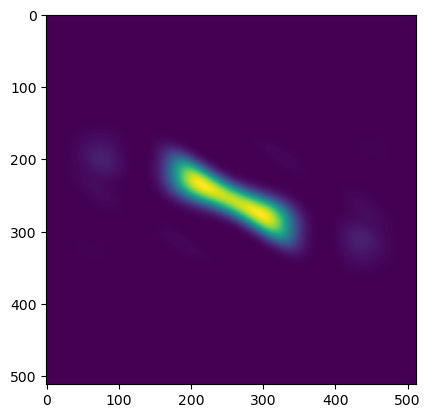

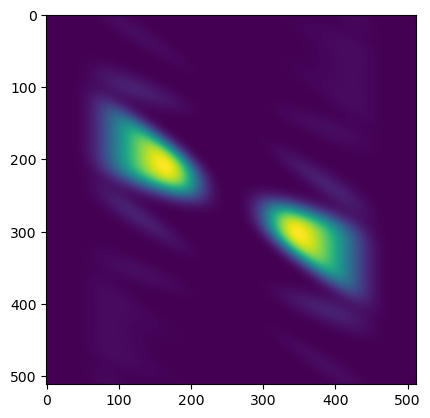

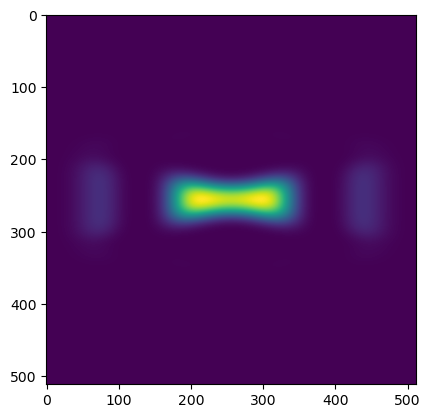

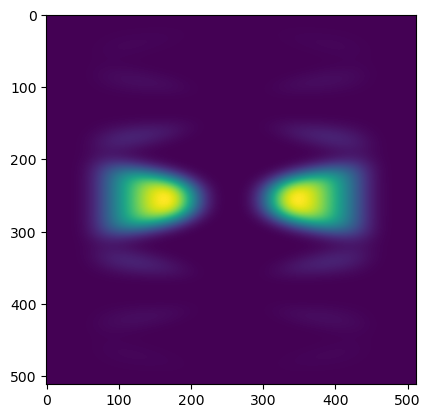

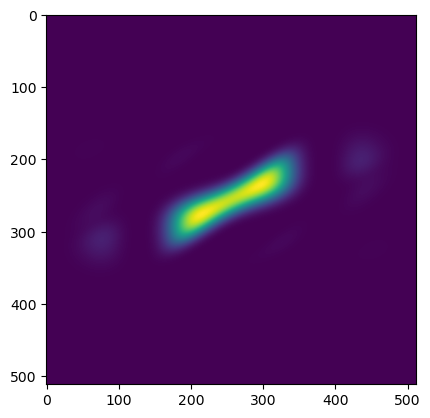

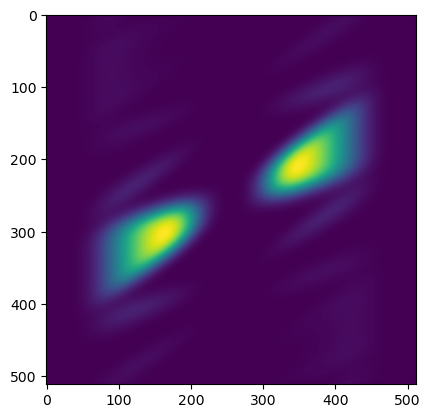

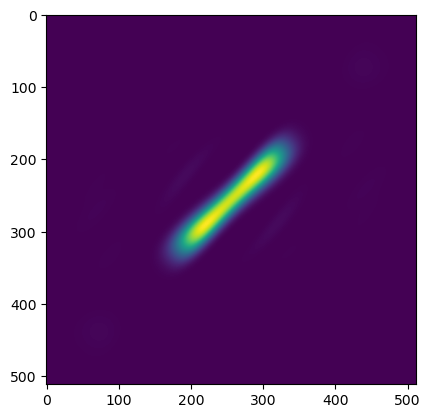

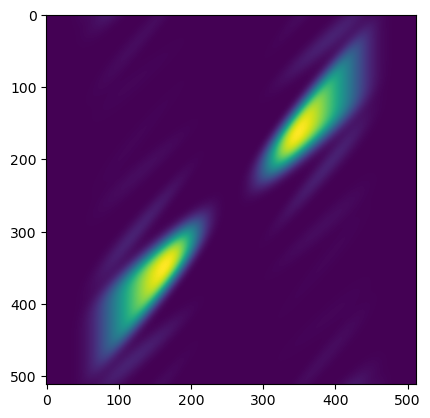

In [ ]:
wedge = preparedFilters["cone1"]["wedge"][1]
print(wedge.shape, lowpass.shape)
for i in range(wedge.shape[-1]):
    plt.imshow(wedge[..., i][..., np.newaxis].real * lowpass.real)
    plt.show()
    plt.imshow(wedge[..., i][..., np.newaxis].real * bandpass[..., 0][..., np.newaxis].real)
    plt.show()

In [ ]:
shearletIdxs

array([[ 1,  1, -2],
       [ 1,  1, -1],
       [ 1,  1,  0],
       [ 1,  1,  1],
       [ 1,  1,  2],
       [ 1,  2, -2],
       [ 1,  2, -1],
       [ 1,  2,  0],
       [ 1,  2,  1],
       [ 1,  2,  2],
       [ 2,  1, -1],
       [ 2,  1,  0],
       [ 2,  1,  1],
       [ 2,  2, -1],
       [ 2,  2,  0],
       [ 2,  2,  1],
       [ 0,  0,  0]])

In [ ]:
for j in range(shearletIdxs.shape[0]):
    cone = shearletIdxs[j,0]
    scale = shearletIdxs[j,1]
    shearing = shearletIdxs[j,2]
    if cone == 0:
        print(j, 'lowpass scale', scale)
    elif cone == 1:
        print(j, 'cone 1 bandpass scale', scale)
    else:
        print(j, 'cone 2 bandpass scale', scale)

0 cone 1 bandpass scale 1
1 cone 1 bandpass scale 1
2 cone 1 bandpass scale 1
3 cone 1 bandpass scale 1
4 cone 1 bandpass scale 1
5 cone 1 bandpass scale 2
6 cone 1 bandpass scale 2
7 cone 1 bandpass scale 2
8 cone 1 bandpass scale 2
9 cone 1 bandpass scale 2
10 cone 2 bandpass scale 1
11 cone 2 bandpass scale 1
12 cone 2 bandpass scale 1
13 cone 2 bandpass scale 2
14 cone 2 bandpass scale 2
15 cone 2 bandpass scale 2
16 lowpass scale 0


In [ ]:
x = np.arange(11)

def qmf(x):
    assert x.size % 2, 'qmf has to have odd length'
    return np.power(-1, np.arange(x.size)) * x[::-1]

qmf(x), qmf(qmf(x))

(array([10, -9,  8, -7,  6, -5,  4, -3,  2, -1,  0]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]))

In [ ]:
preparedFilters["cone1"]["wedge"][1].shape, preparedFilters["cone1"]["lowpass"].shape, preparedFilters["cone1"]["bandpass"].shape

((512, 512, 5), (512, 512), (512, 512, 2))

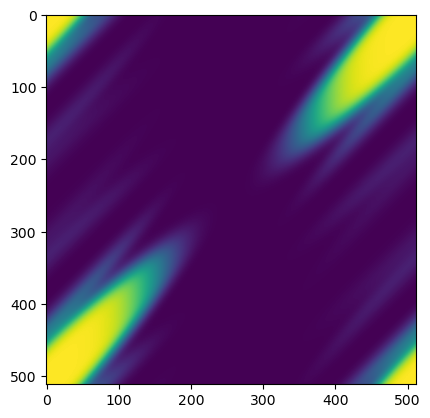

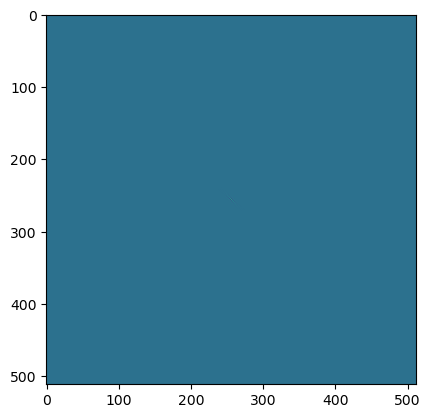

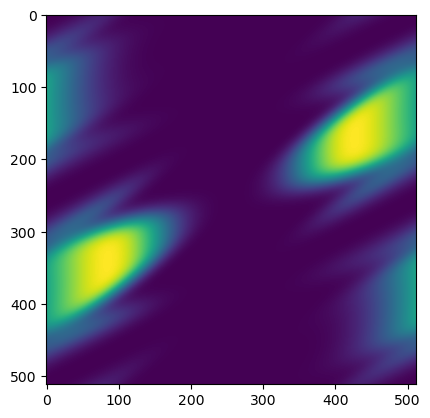

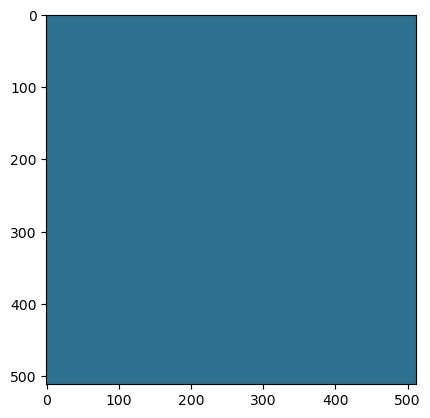

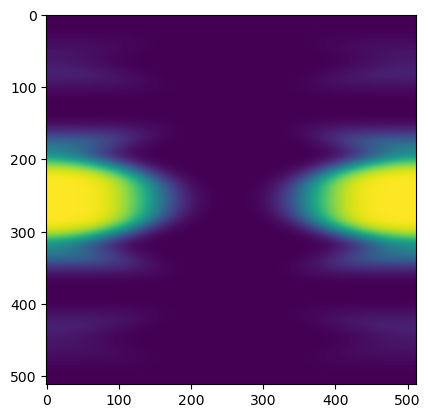

...

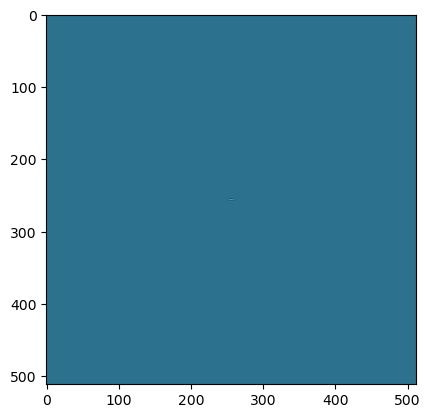

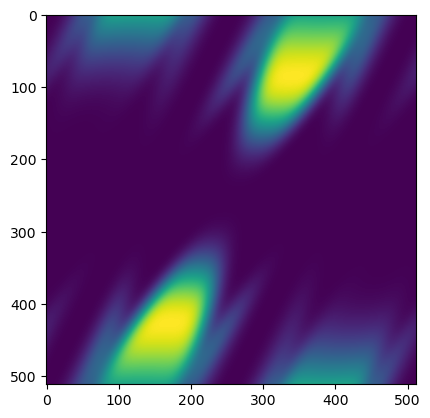

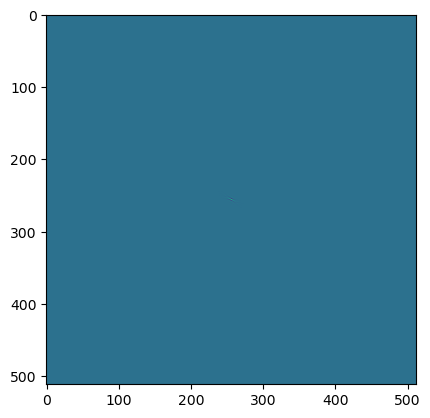

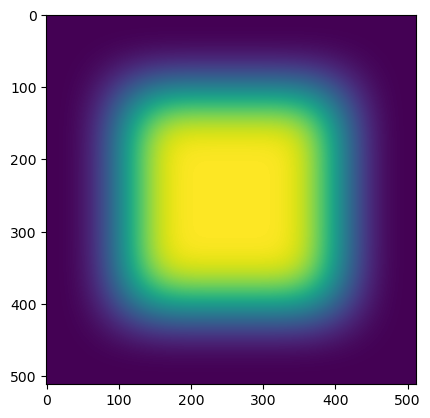

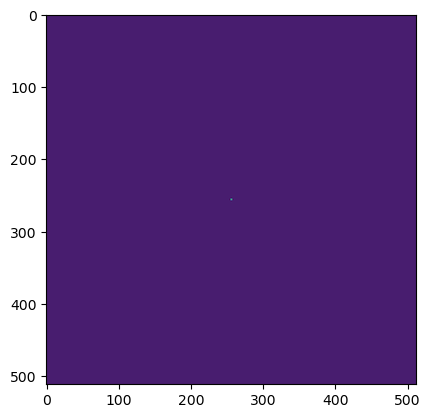

In [ ]:
shearlets = og_system["shearlets"]
fftlib = np.fft

for i in range(shearlets.shape[-1]):
    plt.imshow(shearlets[..., i].real)
    plt.show()
    plt.imshow(fftlib.fftshift(fftlib.fft2(fftlib.ifftshift(shearlets[..., i]))).real)
    plt.show()

16


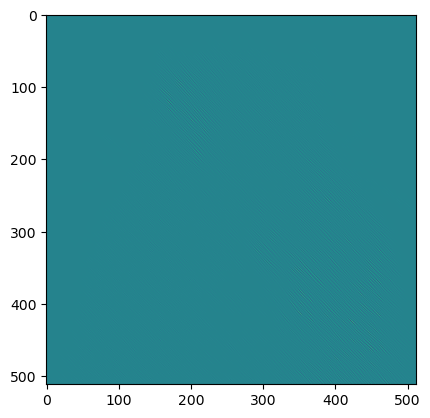

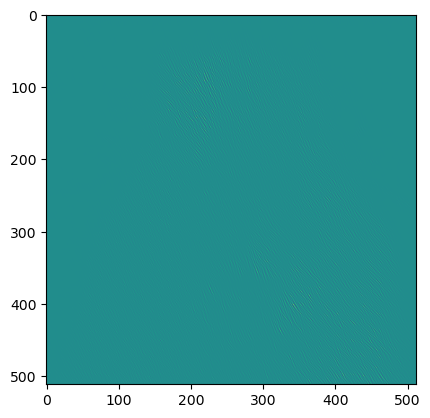

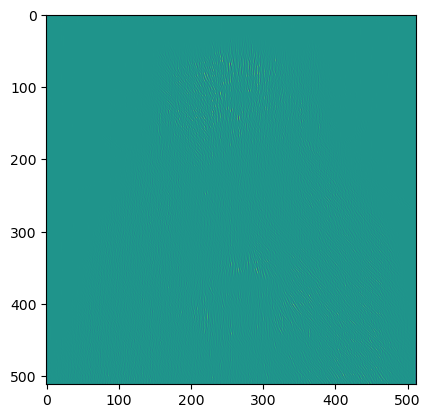

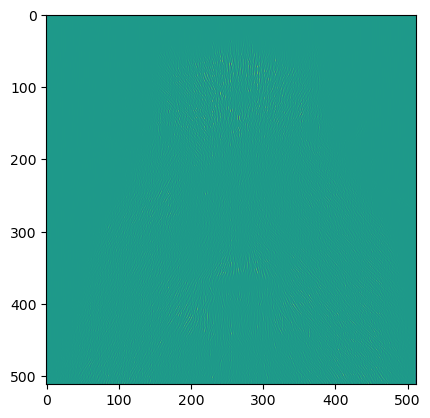

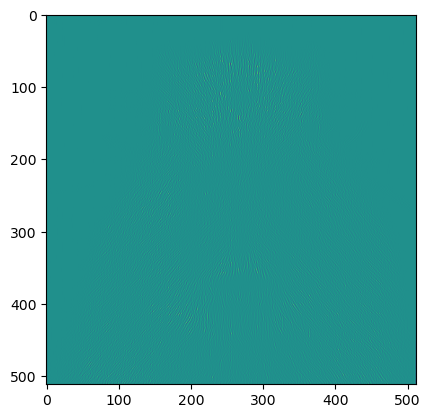

...

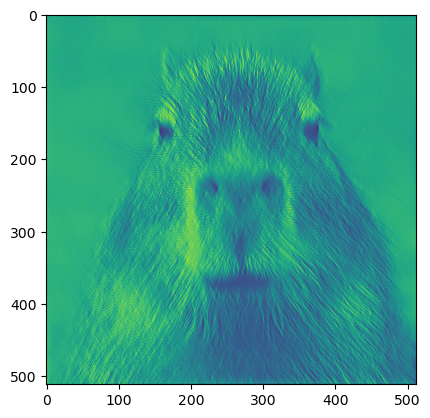

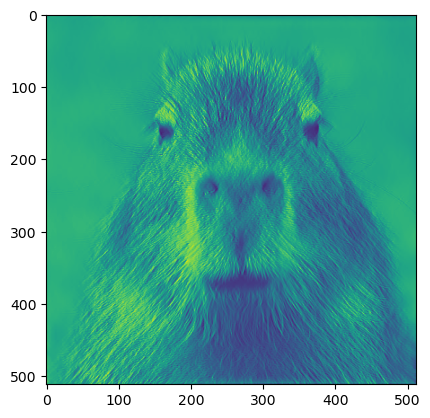

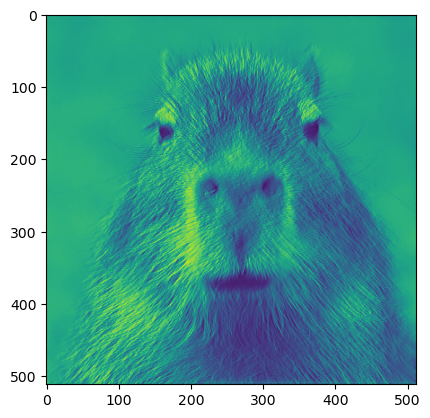

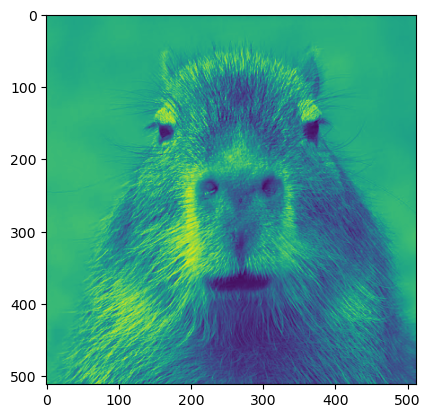

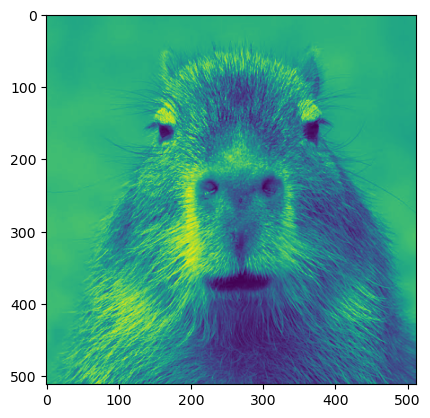

reconstruction


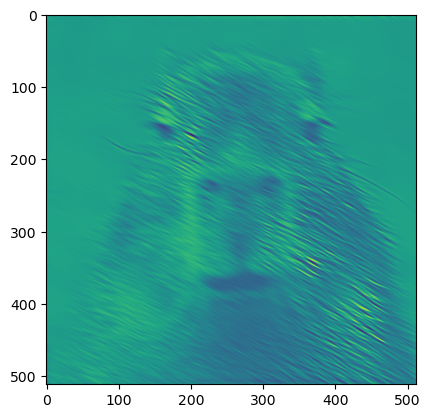

low pass


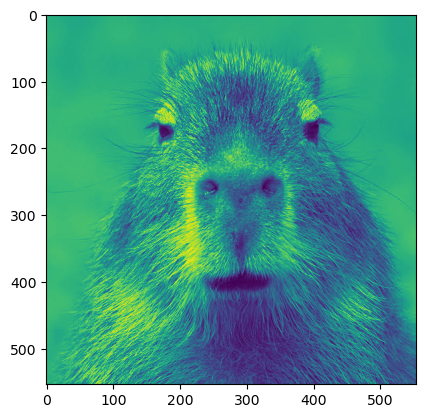

image


In [ ]:
coeffs = pyshearlab.SLsheardec2D(image, system1)

assert coeffs.shape[-1] == system1["shearlets"].shape[-1]
print(coeffs.shape[-1])
# coeffs[..., :8] = 0
for i in range(coeffs.shape[-1]):
    coeffs_new = coeffs.copy()
    coeffs_new[..., i+1:] = 0
    Xrec = pyshearlab.SLshearrec2D(coeffs_new, system1)
    plt.imshow(Xrec)
    plt.show()
print('reconstruction')
coeffs_new = coeffs.copy()
coeffs_new[..., :-1] = 0
Xrec = pyshearlab.SLshearrec2D(coeffs_new, system1)
plt.imshow(Xrec)
plt.show()
print('low pass')
plt.imshow(img)
plt.show()
print('image')

coeffs_pyramid1 = coeffs.copy()

8
Data is probably not real-valued. Largest magnitude: 0.23049678691237713
Imaginary part neglected.


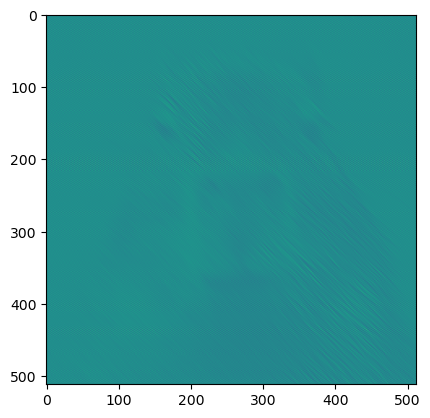

Data is probably not real-valued. Largest magnitude: 0.27847726337256484
Imaginary part neglected.


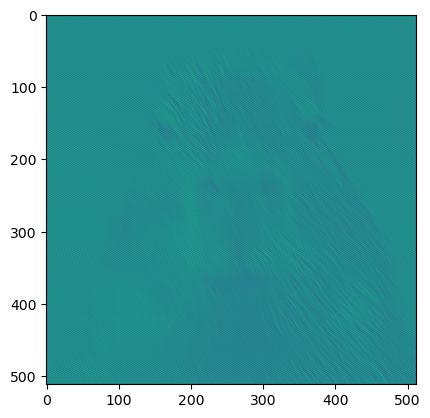

Data is probably not real-valued. Largest magnitude: 0.2841381218308777
Imaginary part neglected.


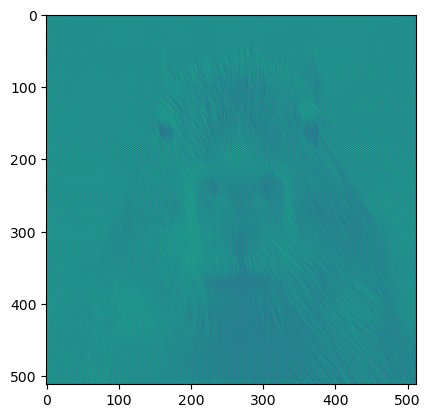

Data is probably not real-valued. Largest magnitude: 0.35357674589351407
Imaginary part neglected.


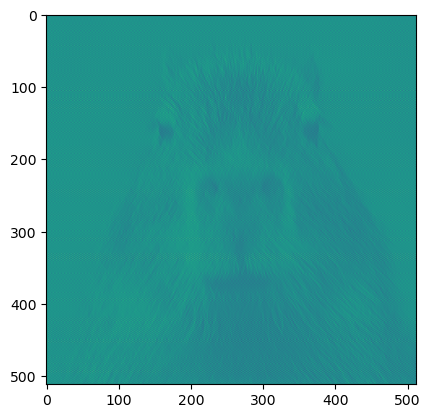

Data is probably not real-valued. Largest magnitude: 0.3645140695327894
Imaginary part neglected.


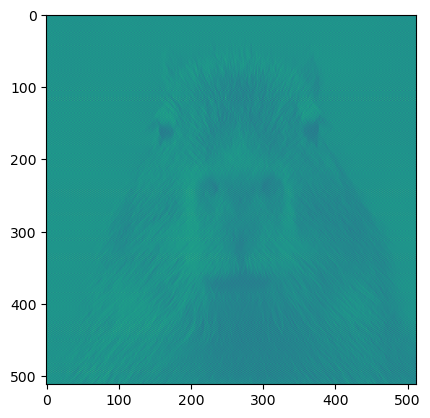

Data is probably not real-valued. Largest magnitude: 0.511450309723422
Imaginary part neglected.


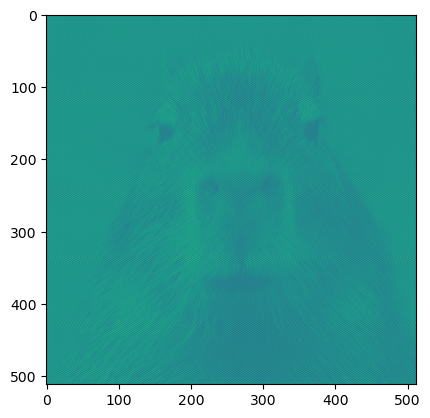

Data is probably not real-valued. Largest magnitude: 0.5377188602249326
Imaginary part neglected.


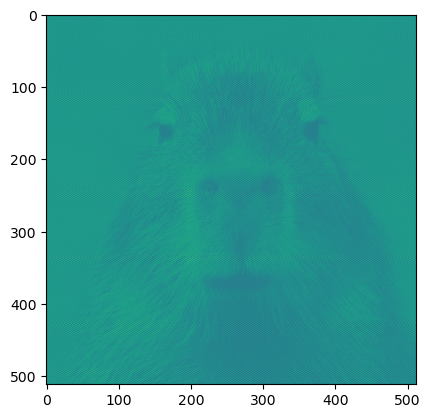

Data is probably not real-valued. Largest magnitude: 0.5757335275417467
Imaginary part neglected.


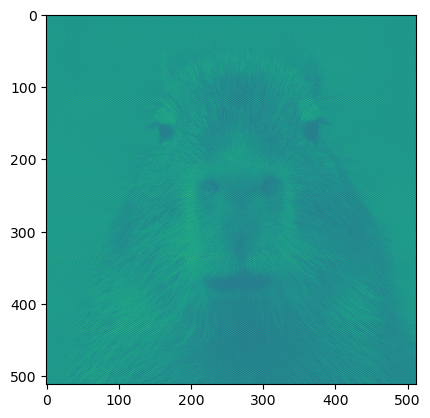

reconstruction
Data is probably not real-valued. Largest magnitude: 0.3297530532061711
Imaginary part neglected.


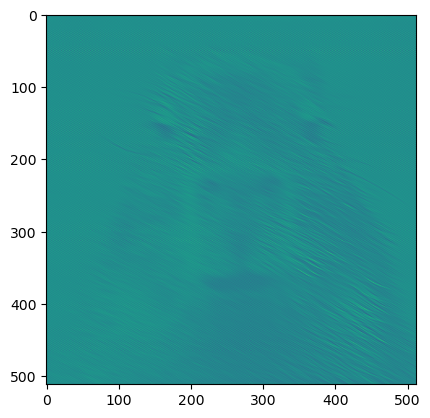

low pass


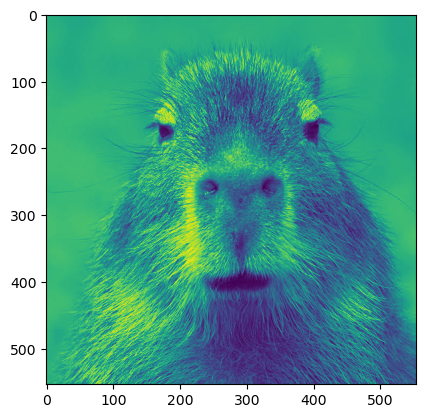

image


In [ ]:
coeffs = pyshearlab.SLsheardec2D(image, system2)

assert coeffs.shape[-1] == system2["shearlets"].shape[-1]
print(coeffs.shape[-1])
# coeffs[..., :8] = 0
for i in range(coeffs.shape[-1]):
    coeffs_new = coeffs.copy()
    coeffs_new[..., i+1:] = 0
    Xrec = pyshearlab.SLshearrec2D(coeffs_new, system2)
    plt.imshow(Xrec)
    plt.show()
print('reconstruction')
coeffs_new = coeffs.copy()
coeffs_new[..., :-1] = 0
Xrec = pyshearlab.SLshearrec2D(coeffs_new, system2)
plt.imshow(Xrec)
plt.show()
print('low pass')
plt.imshow(img)
plt.show()
print('image')

coeffs_pyramid2 = coeffs.copy()

9


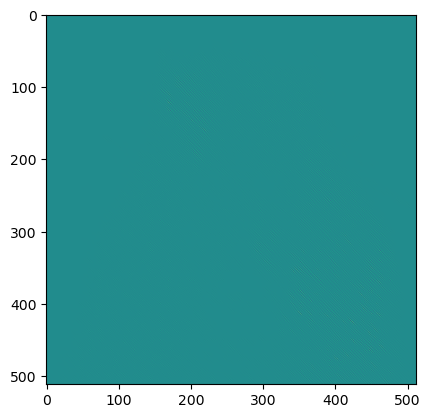

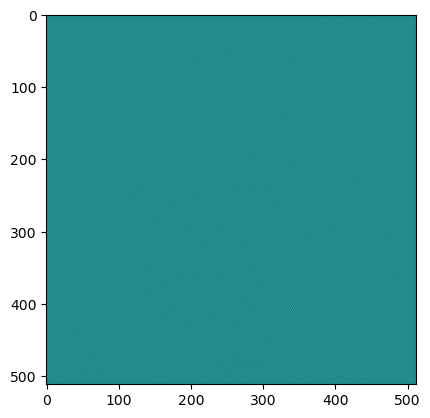

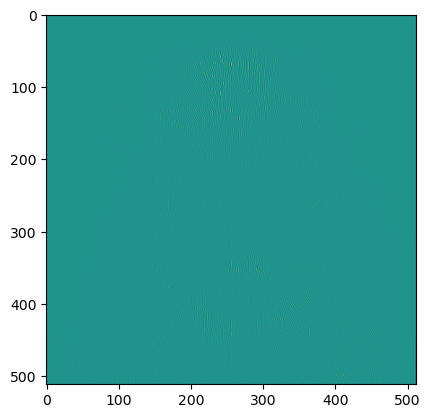

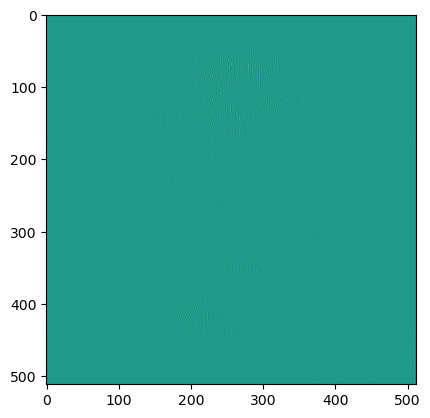

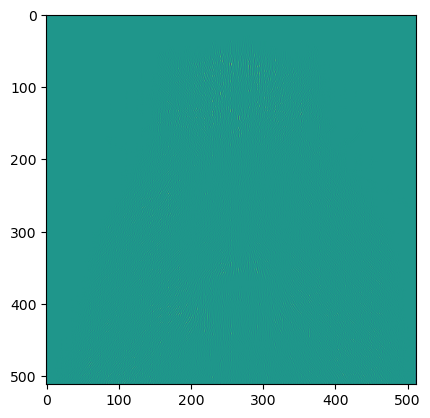

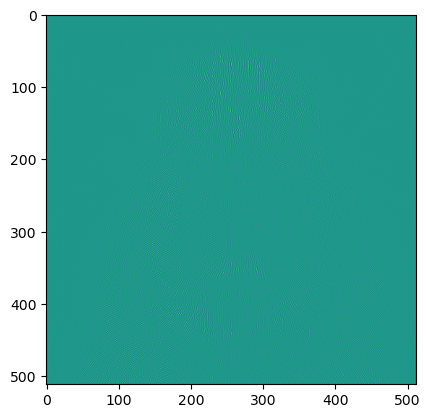

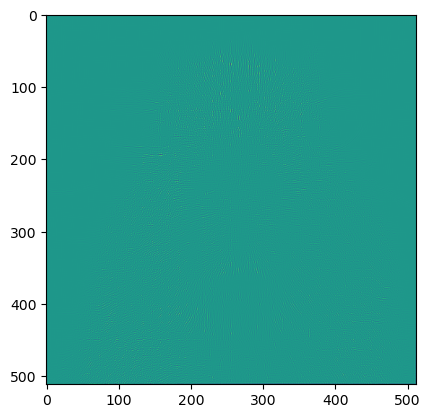

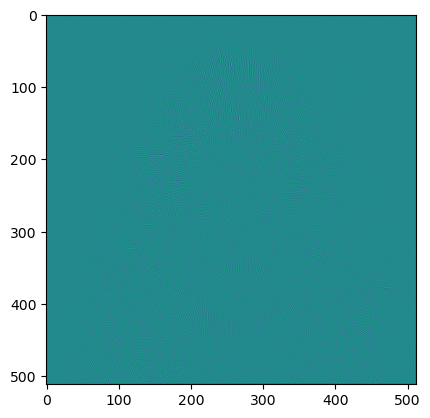

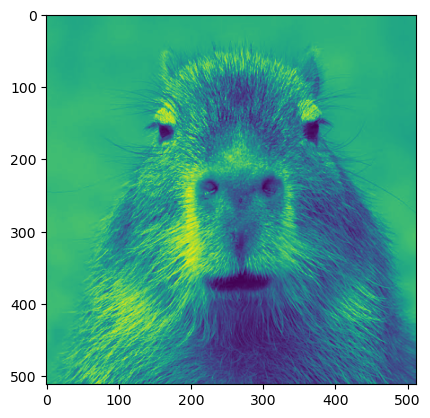

reconstruction


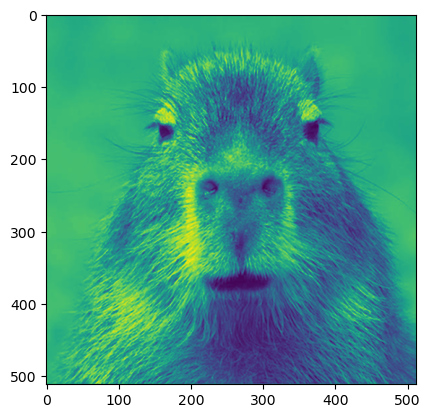

low pass


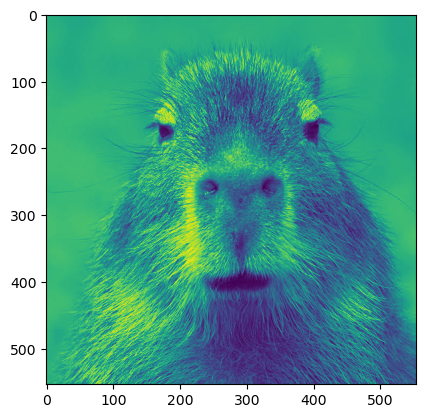

image


In [ ]:
coeffs = pyshearlab.SLsheardec2D(image, og_system)

assert coeffs.shape[-1] == og_system["shearlets"].shape[-1]
print(coeffs.shape[-1])
# coeffs[..., :8] = 0
for i in range(coeffs.shape[-1]):
    coeffs_new = coeffs.copy()
    coeffs_new[..., i+1:] = 0
    Xrec = pyshearlab.SLshearrec2D(coeffs_new, og_system)
    plt.imshow(Xrec)
    plt.show()
coeffs_new = coeffs.copy()
coeffs_new[..., :i] = 0
Xrec = pyshearlab.SLshearrec2D(coeffs_new, og_system)
print('reconstruction')
plt.imshow(Xrec)
plt.show()
print('low pass')
plt.imshow(img)
plt.show()
print('image')

coeffs_og = coeffs.copy()

reconstruction


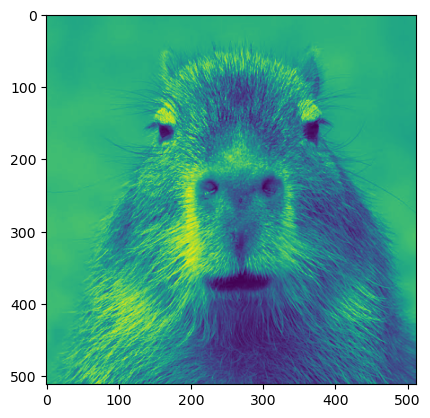

reconstruction


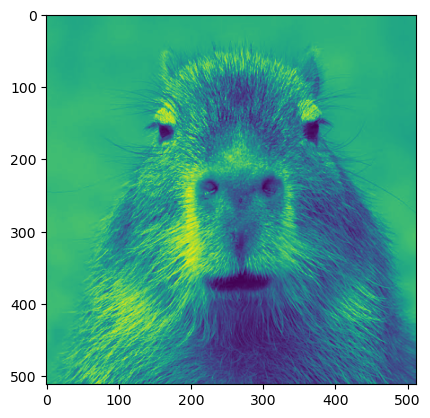

image


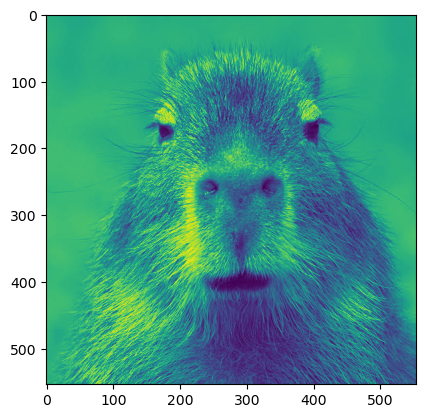

In [ ]:
Xrec = pyshearlab.SLshearrec2D(coeffs_pyramid1, system1)
print('reconstruction')
plt.imshow(Xrec)
plt.show()

Xrec = pyshearlab.SLshearrec2D(coeffs_og, og_system)
print('reconstruction')
plt.imshow(Xrec)
plt.show()

print('image')
plt.imshow(img)
plt.show()